DSCI 2012 - Data Wrangling

# Working with Binary Data: Part 1 (Images)

This notebook shows you how to work with images, an example of binary data.

## What is a Binary File?

Both binary and text files contain bits (1s and 0s), but text files use bits to represent characters (human symbols), while binary files encode data in a defined format to represent data in some customized way. For example, a .jpg image file is binary and it encodes information about how to reconstruct the pixels of an image. A Python script is a text file - it encodes characters that humans can read as strings like "print."

Binary files can be smaller than text files which means they can be transfered faster and loaded into memory more quickly. The great thing about text files is that you can easily open them even if there are errors because the errors just show up as text that a human can repair / change. You can also use many command-line utilities to work with text files on a unix system and this makes them convenient (e.g., "grep").

Today we will load in image files that our Python libraries will represent to us as numbers that we can understand.

## Images

Let's tackle images first since they are so important to computer vision and are the product of one of the most important sensors, cameras.

In [1]:
# Import library that helps us deal with the file system and other operating system (os) stuff
import os

# Import our normal pandas and numpy used in wrangling
import numpy as np
import pandas as pd

# These libraries allow us to work with images in matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Pillow is one of the most popular ways to work with images
# Let's install and import Pillow

try:
    from PIL import Image, ImageFilter
except:
    !pip install Pillow
    from PIL import Image, ImageFilter



Matplotlib has an image library that we can use. It is documented here - https://matplotlib.org/stable/api/image_api.html. But we are going to use something more popular - Pillow.

Pillow is documented here: https://pillow.readthedocs.io/en/stable/index.html

### Opening an Image File

Let's load up an image from your hard drive with Pillow and then view the representation of it.

In [2]:
# open the file and then load it up as an image
with Image.open('starrynight.png') as starryNight:
    starryNight.load()

# What Type is it?
type(starryNight)
    

PIL.PngImagePlugin.PngImageFile

Ah, the image is a PNG; that's good - it matches the file extension (.png).

### Accessing Image Attributes using Python

What can we find out about this image:

In [3]:
# Its format: 
print(starryNight.format)

# Its size:
print(starryNight.size)

# Its color mode:
print(starryNight.mode)

PNG
(1512, 1198)
RGBA


Wow, it's 1512 x 1198. That means it has this many pixels:

In [4]:
print(starryNight.size[0] * starryNight.size[1])

1811376


And since the mode is "RGBA" that means it is composed of RGB pixels (red, green, blue) along with another value ("A") for level of transparency.

### Displaying an Image

Let's view it now using a jupyter method and a pillow method. 

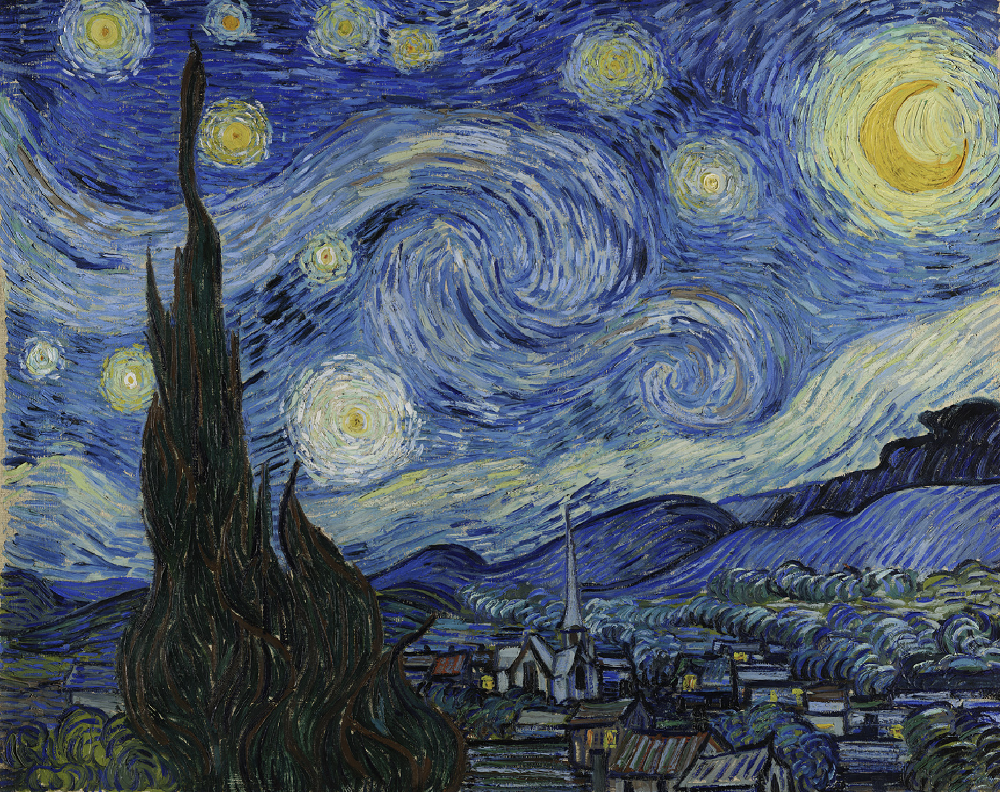

In [5]:
# Pillow will show the image in another window
starryNight.show()

# Good old Jupyter will show it right here
display(starryNight)

There are many types of image files. Your mobile phone generally stores photos in JPEG format because it is great for the kind of variation that we commonly see in photos. PNGs and GIFs are great for images that contain pictures of text because those formats are more optimized for crispness. PNGs, JPGs, GIFs, and other similar formats are "raster" formats - meaning they store information about the image as a set of points that have a color at some bit depth. Bit depth refers to the number of colors the image uses to represent the colors of the real world. You will learn more about bit depth in the Data Acquisition course. The higher the bit depth, the more colors can be represented. Humans can only distinguish about 10 million colors.

## Editing an Image

### Cropping

Let's crop this image and just get that sweet Van Gogh star as an image.

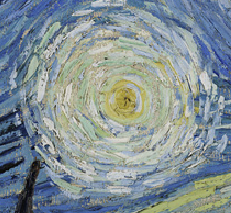

In [6]:
# The .crop() method crops out a box of the image.
# The box is a 4-tuple defining the left, upper, right, and lower pixel coordinate - x,y / x,y
# Documented here: https://pillow.readthedocs.io/en/stable/reference/Image.html#PIL.Image.Image.crop

justTheStar = starryNight.crop((413, 537, 644, 750))
display(justTheStar)

Voila, just the star. The coordinate system assumed by the box we defined above is defined here https://pillow.readthedocs.io/en/stable/handbook/concepts.html#coordinate-system, but it is easy to remember. The upper lefthand corner of the image is at (0,0) and most programming languages use the convention of x,y (left-right, up-down).

## Exercise 1:

Now, let's practice croppping.

(337, 400)


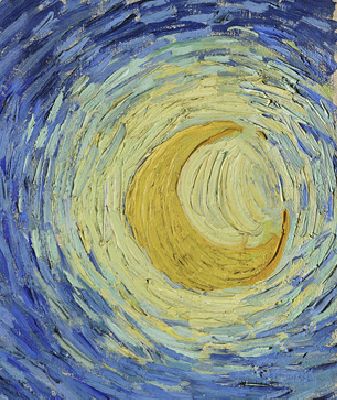

In [7]:
# a. Crop out just the moon and store in a variable
#the moon is in the upper right corner
# (1512, 1198)
#left, upper -> test with 1000, 0 (this is just to start)
# right, lower -> test with 1512, 400 
justTheMoon = starryNight.crop((1175, 0, 1512, 400))
# b. Use Python to print the dimensions of your moon image using img attributes
print(justTheMoon.size)
# c. Show your cropped moon image in this notebook.
display(justTheMoon)

### Resizing

Sometimes images can be way too large to work with efficiently. It is common in computer vision work to reduce the size of images significantly.

Let's resize our large Starry Night

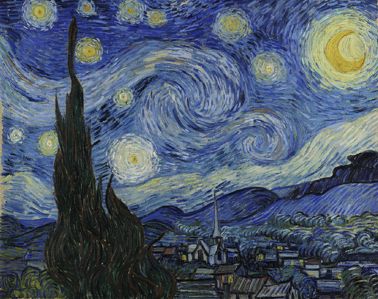

In [8]:
# Let's give Pillow's resize method a tuple that defines the new width and height 
# of the image in pixels and let's get just 1/4 of the full size
starryNightSmall = starryNight.resize((starryNight.width // 4, starryNight.height // 4))
display(starryNightSmall)

Notice that we used the "floor division operator" (//) in Python. Floor division rounds down to nearest integer. For example, the expression 11 // 4 evaluates to 2 in contrast to the 2.75 returned by float true division. The reason? Well, because resolution is in number of pixels and we can't have a fraction of a pixel.

### Saving an Image

Now that we have a lower res image, let's save it and compare the file size. We'll save it as several different image formats. The Pillow library is smart enought to know the format just based on our file extension.

In [9]:
# Save as PNG
starryNightSmall.save("StarryNightSmall.png")

# Save as JPG
starryNightSmall.save("StarryNightSmall.jpg")



OSError: cannot write mode RGBA as JPEG

Wow, an error. Notice it is says "cannot write mode RGBA as JPEG." This is because the JPEG format doesn't support transparency. First, we have to remove the transparency, then save as JPG.

In [10]:
# Convert from RGBA to RGB
starryNightSmallNonTransparent = starryNightSmall.convert('RGB')

# Save as JPG with 100% quality
starryNightSmallNonTransparent.save("StarryNightSmall.jpg")


Now look at your directory and compare StarryNightSmall.png to StarryNightSmall.png. 

## Exercise 2: Comparing Image Sizes

Answer a few questions about the images we just saved.

In [11]:
# You don't need Python for any of this. Just use the Windows Explorer or the Mac Finder

# a. How large (kilobytes) is the StarryNightSmall.png?
# 286 kb
# b. How large is StarryNightSmall.jpg?
# 31 kb
# c. Drag each image into a browser window; they should look pretty similar

# d. What advantage does the .jpg have?
# conserves space in comparison to .png


### JPEG Quality Levels

One cool thing about the .jpg format is that you can save it at different quality levels. Run this code:

In [12]:
starryNightSmallNonTransparent.save("StarryNightSmall100.jpg", quality=100)
starryNightSmallNonTransparent.save("StarryNightSmall80.jpg", quality=80)
starryNightSmallNonTransparent.save("StarryNightSmall50.jpg", quality=50)
starryNightSmallNonTransparent.save("StarryNightSmall20.jpg", quality=20)

In [13]:
# e. Which quality level takes up the most disk space?
# 100
# f. Compare the quality 100 to quality 20 - what's the difference?
# in 100 the image is a lot crisper so you can see more detail, while in 20 it is blurry

## More Editing of Images

### Transposing Images

Can I flip it? Yes you can. [Can I flip it? Yes you can.](https://www.youtube.com/watch?v=O3pyCGnZzYA)

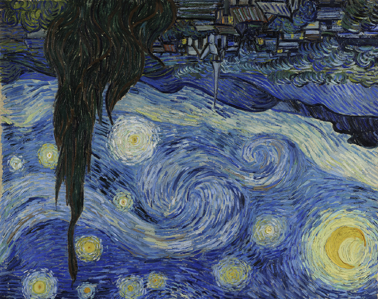

In [14]:
starryNightFlipped = starryNightSmall.transpose(Image.Transpose.FLIP_TOP_BOTTOM)

display(starryNightFlipped)

The Image.Transpose options are:
        
- Image.Tranpose.FLIP_LEFT_RIGHT: Flips the image left to right, resulting in a mirror image
- Image.Tranpose.FLIP_TOP_BOTTOM: Flips the image top to bottom
- Image.Tranpose.ROTATE_90: Rotates the image by 90 degrees counterclockwise
- Image.Tranpose.ROTATE_180: Rotates the image by 180 degrees
- Image.Tranpose.ROTATE_270: Rotates the image by 270 degrees counterclockwise, which is the same as 90 degrees clockwise
- Image.Tranpose.TRANSPOSE: Transposes the rows and columns using the top-left pixel as the origin, with the top-left pixel being the same in the transposed image as in the original image
- Image.Tranpose.TRANSVERSE: Transposes the rows and columns using the bottom-left pixel as the origin, with the bottom-left pixel being the one that remains fixed between the original and modified versions

For example, we can rotate it 90 degrees:

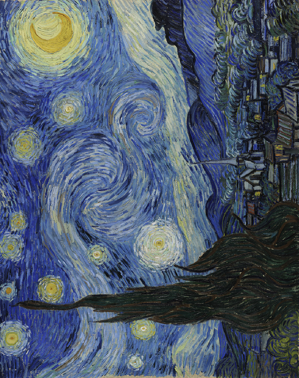

In [15]:
starryNightRotated = starryNightSmall.transpose(Image.Transpose.ROTATE_90)

display(starryNightRotated)

You can also arbitrarily rotate it by any angle:

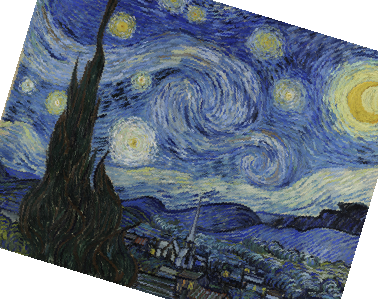

In [16]:
starryNightRotatedNegative17 = starryNightSmall.rotate(-17)

display(starryNightRotatedNegative17)

You can see that we ended up cutting off the corners. We need to give pillow the permission to make the image larger:

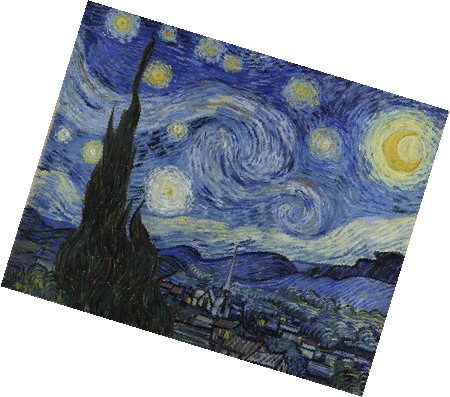

In [17]:
starryNightRotatedNegative17 = starryNightSmall.rotate(-17, expand=True)
display(starryNightRotatedNegative17)

### Changing the Color Scale of Images

Let's make our image into a greyscale image.


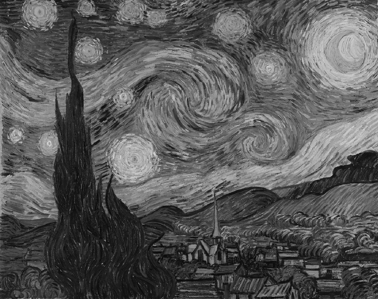

In [18]:
grayNight = starryNightSmall.convert("L")
display(grayNight)


Converting, in this case, was from RGBA to L.

### Combining

We can also combine images.  Let's take the little star we cropped, turn it into greyscale, flip it upside down, then paste back onto the big image.

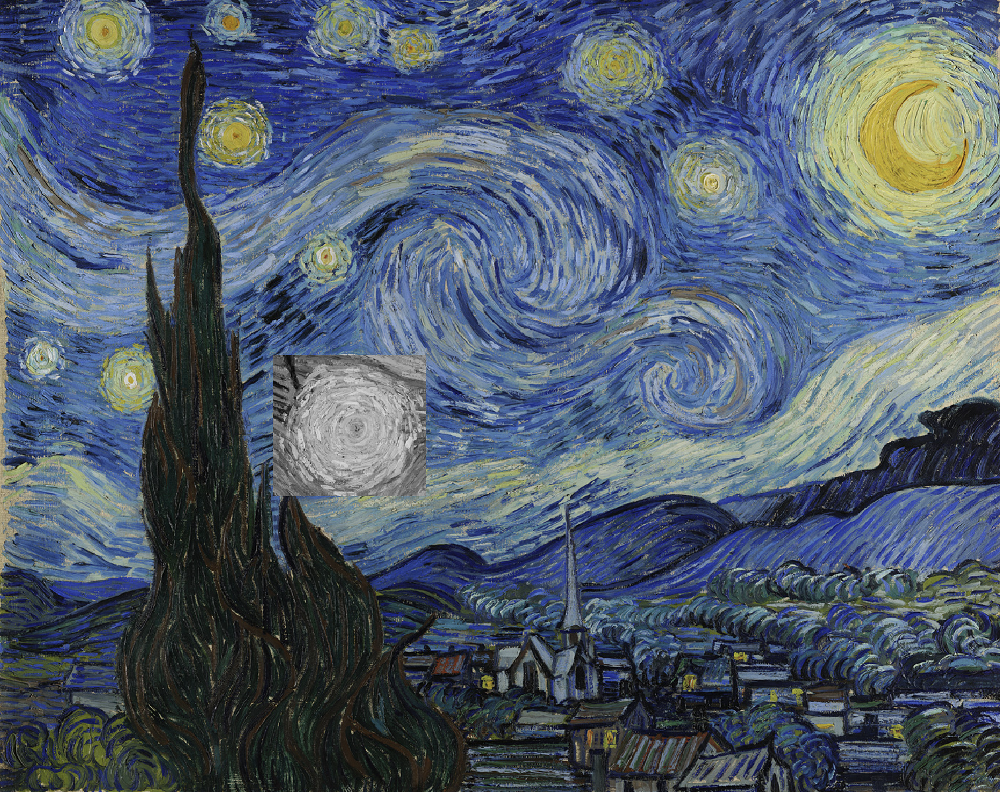

In [19]:
# this was the original crop box we used
box = (413, 537, 644, 750)

# notice we can chain together transformations
grayStarFlipped = justTheStar.convert("L").transpose(Image.Transpose.FLIP_TOP_BOTTOM)

# paste the small image onto the big one at the box location
starryNight.paste(grayStarFlipped, box)

# show it
display(starryNight)

### Smoothing / Sharpening / Blurring

You can also transform images just like you could in Photoshop.

The .Filter() supports:

- BLUR
- CONTOUR
- DETAIL
- EDGE_ENHANCE
- EDGE_ENHANCE_MORE
- EMBOSS
- FIND_EDGES
- SHARPEN
- SMOOTH
- SMOOTH_MORE

Let's sharpen the small image we made earlier:

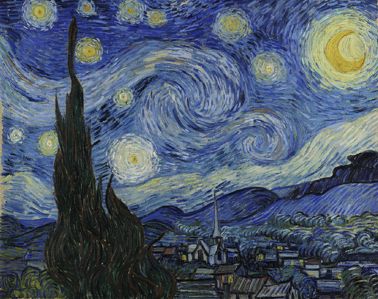

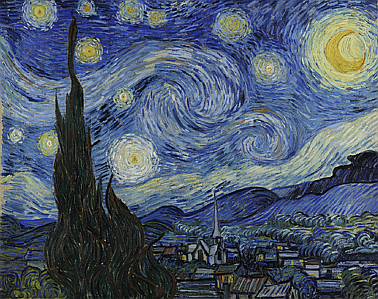

In [20]:
# show what we started with
display(starryNightSmall)

# sharpen it
sharperStarryNightSmall = starryNightSmall.filter(ImageFilter.SHARPEN)

# Show the after
display(sharperStarryNightSmall)

Most of the time, when you reduce the size of an image you'll need to do some sharpening. The resize also supports various ways to 'interpolate' an image - a strategy for how to handle going from, in our case, 4 pixels to 1.

Enhancing edges can be useful in preparing images for computer vision.

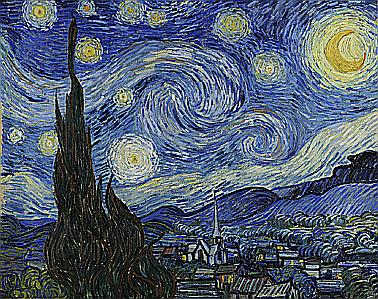

In [21]:
# find edges and show
smallStarryNightEdges = starryNightSmall.filter(ImageFilter.EDGE_ENHANCE)
display(smallStarryNightEdges)

## Working with the Points in the Image

The image is made up of many points (pixels) and each has several bands - RGB or RGBA. Each band's value is a number between 0 and 255 (0 and 1). White would be r=255, g=255, b=255. Red would be r=255, g=0, b=0. Let's show how you could work with the numbers in an image.

This is just for your future knowledge so that you know it's possible to manipulate images down to this degree of detail. Let's play with the settings and see what we can do by modifying the various channels.

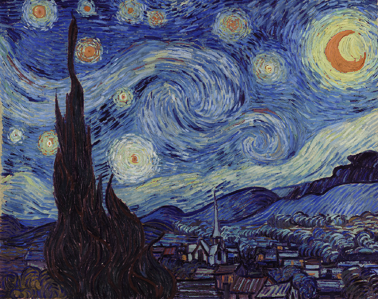

In [22]:
# split the image into individual bands
source = starryNightSmall.split()

# constants that refer to the bands
R, G, B = 0, 1, 2

# select regions where red is less than 100
mask = source[B].point(lambda i: i < 100 and 255)

# process the blue band by making it 70% of itself
out = source[G].point(lambda i: i * .7)

# paste the processed band back, but only where red was < 100
source[G].paste(out, None, mask)

# build a new multiband image
newStarryNight = Image.merge(starryNightSmall.mode, source)

display(newStarryNight)

## Batch Processing of Images

Often, in a machine learning project, you'll need to batch process images. 

In the /bigPhotos directory are several images from a data science gathering. Let's process them in batch.


In [23]:
# where to save them
# be sure you create this output directory
outputImagePath = "smallPhotos"

# let's scale them down by 75% (divide by four)
resizeAmount = 4

# open up the source directory
with os.scandir("./bigPhotos") as fileList:
    # loop through all the files in the filelist
    for entry in fileList:
        # if the file is a jpg, then..
        if entry.name.endswith(".jpg") and entry.is_file():
            # open it
            with Image.open(entry.path) as bigImage:
                # resize it using the .thumbnail method
                bigImage.thumbnail((bigImage.width // resizeAmount,bigImage.height // resizeAmount))
                # create a new name out of the old name
                newName = outputImagePath + "/" + entry.name
                # save the resized image as a JPEG at quality 100
                # notice we used a slightly different method for saving here than above
                bigImage.save(newName, "JPEG", quality=100)
                # give some feedback to ourselves so we can see what was processed
                print(f"processing file {entry.name} done...")


processing file capybara.jpg done...
processing file coelecanth.jpg done...
processing file crying.jpg done...
processing file dude_choking.jpg done...
processing file horse_laughing.jpg done...
processing file newt.jpg done...
processing file okapi.jpg done...


Nice, right? Your /smallPhotos directory should be full of images now.

## Exercise 3

In this exercise you will batch process some images as if we were getting them ready for machine learning. You'll be able to practice several image manipulation methods and the use of functions.

In [26]:
#definig out image processing function
# chatgpt was used to help figure out a method for the cropping
def processImg(originalImg):
    #if img is a png
    if originalImg.mode == "RGBA":
        #convert image from RGBA to RGB
        originalImg = originalImg.convert('RGB')
    # 1. crop out a section of the image in the middle, equal to 4/5 of the width / height
    #getting our width and height
    w, h = originalImg.size
    #get our crop width and height
    #note that we divide by 2 for left and uppers to help us center
    crop_w, crop_h = round(w*(4/5)), round(w*(4/5))
    left = (w - crop_w) // 2 #distance from left edge
    upper = (h - crop_h) // 2 #distance from top edge
    right = left + crop_w #right edge of our crop 
    lower = upper + crop_h #bottom edge of our crop
    croppedImg = originalImg.crop((left, upper, right, lower))
    # 2. flip the original image
    # I assumed flipped to make a mirror (FLIP_LEFT_RIGHT)
    flippedImg = originalImg.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
    # 3. paste the cropped section on top of the original image in the place where you extracted it
    flippedImg.paste(croppedImg,(left,upper))
    # 4. resize the new combined image by half
    resizedImg = flippedImg.resize((flippedImg.width // 2, flippedImg.height // 2))
    # 5. sharpen the resized image
    sharpenedImg = resizedImg.filter(ImageFilter.SHARPEN)
     
    return sharpenedImg

In [27]:
# a. Choose 10 photos from your phone and email them to yourself. Store them in a directory called /raw
#making sure our processed dir existed
os.makedirs("processed", exist_ok=True)
# b. Write the code to batch process these and save in a folder called /processed
# Your code will:
count = 0
with os.scandir("raw") as fileList:
    #looping through all the files
    for img in fileList:
        if (img.name.endswith(".jpg") or img.name.endswith(".png")) and img.is_file():
            #opening out file
            with Image.open(img.path) as originalImg:
                #call our processing function
                newImg = processImg(originalImg)
                #formatting the file names was done with help from chatgpt 
                # 6. save the resized image to the /processed directory with a filename 
                #    starting at 00.jpg, continuing to 01.jpg, and so on, to 10.jpg
                #    Use quality level 8 (80%) for the jpgs.
                #using sequential file name format
                newImg.save((f"processed/{count:02}.jpg"), format="JPEG", quality=80)
                # 7. provide feedback to the user as each file is processing.
                print(f"Finished Processing {count:02}.jpg")
                # 8. You must write a function to handle the processing part
                count+=1

# c. Zip up your finished notebook, /raw folder, and /processed folder and upload to canvas.

Finished Processing 00.jpg
Finished Processing 01.jpg
Finished Processing 02.jpg
Finished Processing 03.jpg
Finished Processing 04.jpg
Finished Processing 05.jpg
Finished Processing 06.jpg
Finished Processing 07.jpg
Finished Processing 08.jpg
Finished Processing 09.jpg
Finished Processing 10.jpg
Finished Processing 11.jpg
